## APS Failure at Scania Trucks Data Set

### Dataset Information:
The dataset consists of data collected from heavy Scania
trucks in everyday usage. The system in focus is the
Air Pressure system (APS) which generates pressurised
air that are utilized in various functions in a truck,
such as braking and gear changes. The datasets'
positive class consists of component failures
for a specific component of the APS system.
The negative class consists of trucks with failures
for components not related to the APS. The data consists
of a subset of all available data, selected by experts.

### Dataset Link:
https://archive.ics.uci.edu/ml/datasets/APS+Failure+at+Scania+Trucks#

### Life cycle of Machine learning Project:
* Understanding the Problem Statement
* Data Collection
* Exploratory data analysis
* Data Cleaning
* Data Pre-Processing
* Model Training
* Hyperparameter Tuning

### ML Algorithms used:
1. Logistic regression
2. SVM
3. Decision tree
4. Random forest
5. Adaboost
6. gradient boost
7. XGboost

## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

## Load the dataset

In [2]:
train = pd.read_csv("D:/DATA SCIENCE/FSDS - May 22/ML assignments/APS Failure at Scania/train_set.csv")
test = pd.read_csv("D:/DATA SCIENCE/FSDS - May 22/ML assignments/APS Failure at Scania/test_set.csv")

In [3]:
train

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


In [4]:
test

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,na,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


In [5]:
# concatenate train and test data
data = pd.concat([train,test]).reset_index(drop=True)

In [6]:
# check rows and columns
data.shape

(76000, 171)

In [7]:
data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
75996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
75997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
75998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


In [8]:
data['class'].unique()

array(['neg', 'pos'], dtype=object)

In [9]:
data['class'].value_counts()

neg    74625
pos     1375
Name: class, dtype: int64

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 171 entries, class to eg_000
dtypes: int64(1), object(170)
memory usage: 99.2+ MB


In [11]:
data.describe()

,aa_000
count,7.600000e+04
mean,6.115976e+04
std,2.647366e+05
min,0.000000e+00
25%,8.600000e+02
50%,3.081300e+04
75%,4.884000e+04
max,4.294967e+07


In [12]:
data.describe(include=np.object)

,class,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
count,76000,76000,76000,76000,76000,76000,76000,76000,76000,76000,...,76000,76000,76000,76000,76000,76000,76000,76000,76000,76000
unique,2,31,2230,2028,356,459,199,796,2953,9384,...,40697,37292,41658,43052,37561,35860,28413,10948,31,56
top,neg,na,0,na,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
freq,74625,58692,11041,18842,70307,70217,74882,74162,71135,59336,...,1720,1963,2266,3549,5609,9959,21780,40295,72188,71901


In [13]:
data.duplicated().sum()

0

In [14]:
df = data.copy()

In [15]:
df.shape

(76000, 171)

In [16]:
df.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


In [17]:
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 1 numerical features : ['aa_000']

We have 170 categorical features : ['class', 'ab_000', 'ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000', 'ag_001', 'ag_002', 'ag_003', 'ag_004', 'ag_005', 'ag_006', 'ag_007', 'ag_008', 'ag_009', 'ah_000', 'ai_000', 'aj_000', 'ak_000', 'al_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ar_000', 'as_000', 'at_000', 'au_000', 'av_000', 'ax_000', 'ay_000', 'ay_001', 'ay_002', 'ay_003', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_005', 'az_006', 'az_007', 'az_008', 'az_009', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'ba_007', 'ba_008', 'ba_009', 'bb_000', 'bc_000', 'bd_000', 'be_000', 'bf_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bk_000', 'bl_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'bs_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'bz_000', 'ca_000', 'cb_000', 'cc_000', 'cd_000', 'ce_000', 'cf_000', 'cg_

In [18]:
for col in categorical_features:
    print(df[col].value_counts(normalize=True)*100)
    print('-------------------------')

neg    98.190789
pos     1.809211
Name: class, dtype: float64
-------------------------
na     77.226316
0      18.213158
2       3.268421
4       0.706579
6       0.239474
8       0.119737
10      0.067105
12      0.047368
14      0.025000
16      0.011842
24      0.011842
18      0.007895
20      0.006579
26      0.006579
22      0.005263
38      0.005263
34      0.003947
100     0.003947
58      0.003947
28      0.003947
32      0.002632
52      0.001316
90      0.001316
134     0.001316
204     0.001316
36      0.001316
48      0.001316
44      0.001316
46      0.001316
68      0.001316
30      0.001316
Name: ab_000, dtype: float64
-------------------------
0             14.527632
2130706432    10.343421
na             5.606579
2130706434     2.036842
2              1.280263
                ...    
3032           0.001316
3264           0.001316
3416           0.001316
7702           0.001316
3490           0.001316
Name: ac_000, Length: 2230, dtype: float64
-----------------------

In [19]:
# Replacing the na and nan values with np.NaN
df.replace(to_replace=['na','nan'],value = np.NaN,inplace=True)

In [20]:
df.isna().sum()

class         0
aa_000        0
ab_000    58692
ac_000     4261
ad_000    18842
          ...  
ee_007      863
ee_008      863
ee_009      863
ef_000     3486
eg_000     3485
Length: 171, dtype: int64

In [21]:
null_df = pd.DataFrame({'Null Values' : df.isna().sum().sort_values(ascending=False), 'Percentage Null Values' : (df.isna().sum().sort_values(ascending=False)) / (df.shape[0]) * (100)})
null_df.head(30)

,Null Values,Percentage Null Values
br_000,62393,82.096053
bq_000,61703,81.188158
bp_000,60461,79.553947
bo_000,58709,77.248684
cr_000,58692,77.226316
ab_000,58692,77.226316
bn_000,55722,73.318421
bm_000,50095,65.914474
bl_000,34503,45.398684
bk_000,29128,38.326316


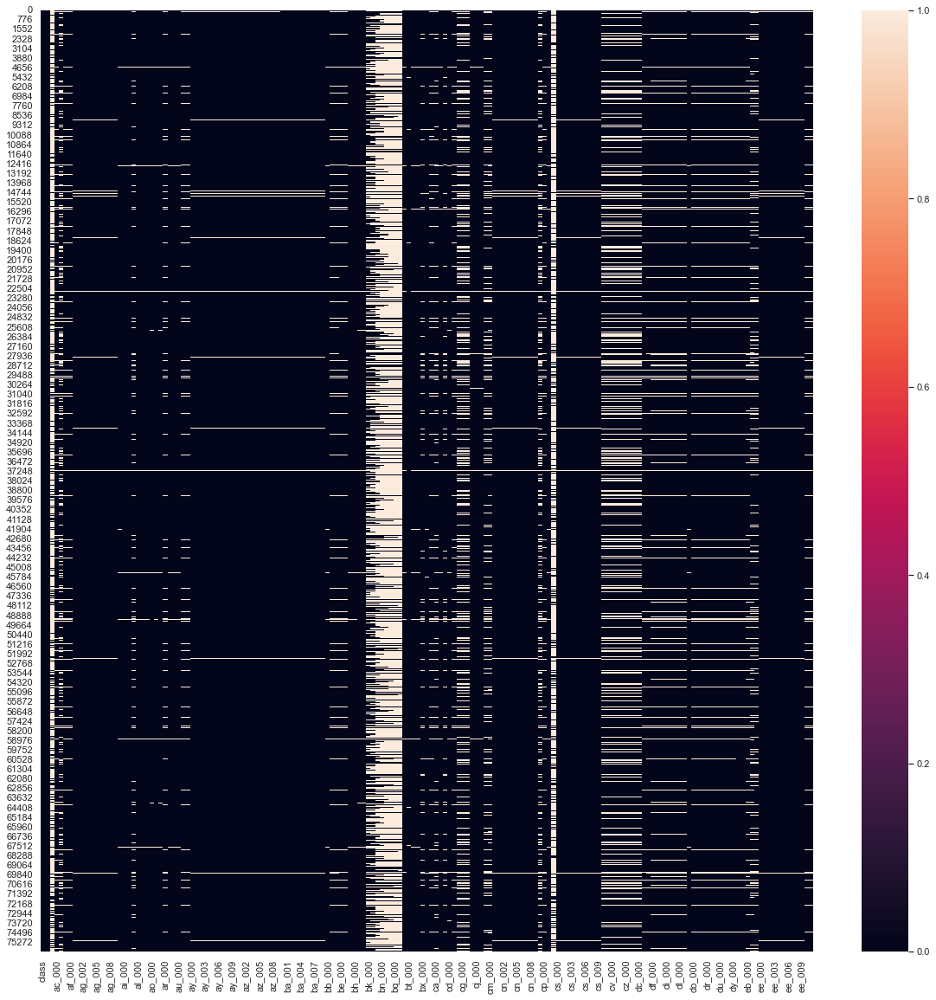

In [22]:
# plotting the heatmap of dataset to visualize the null values.
sns.set(rc={'figure.figsize':(20,20)})
plot = sns.heatmap(df.isnull())
plt.show(plot)

In [23]:
# Mapping neg as 0 and pos as 1
df['class']=df['class'].map({'neg':0,'pos':1})

In [24]:
df['class'].value_counts()

0    74625
1     1375
Name: class, dtype: int64

<AxesSubplot:xlabel='class', ylabel='count'>

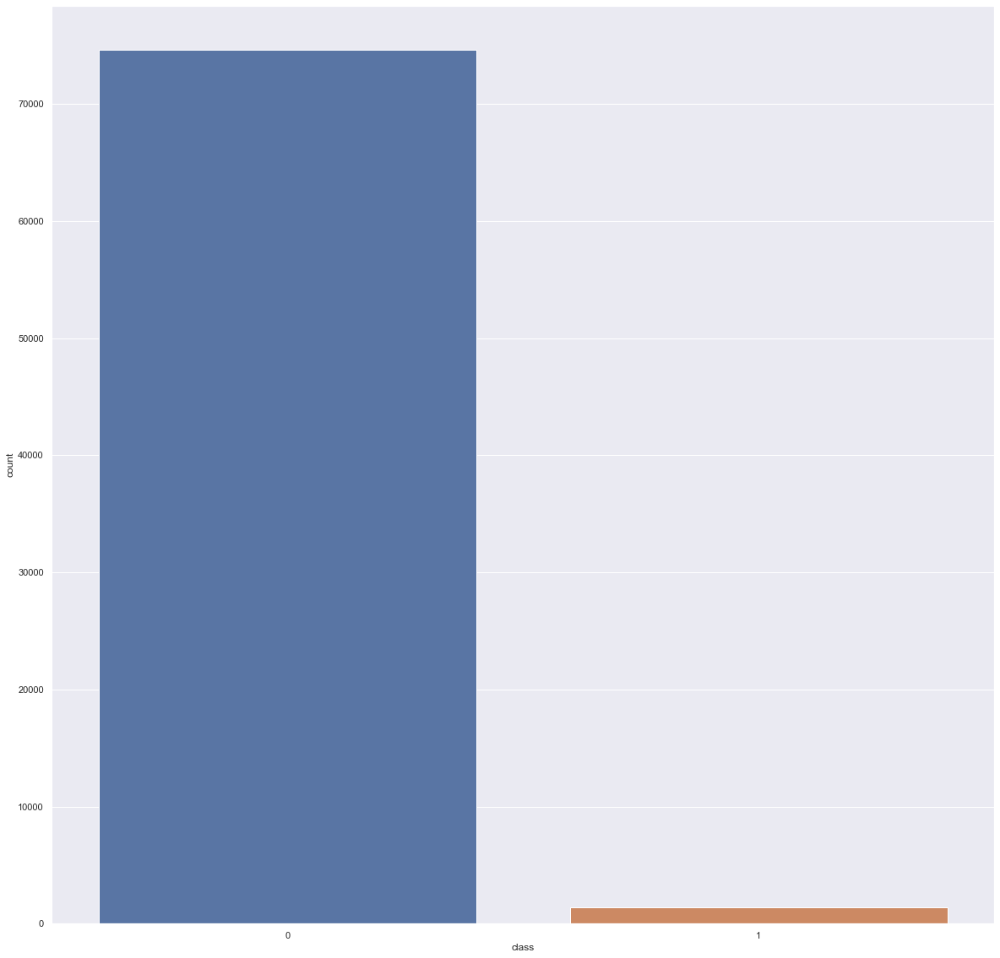

In [25]:
sns.countplot(df['class'])

In [26]:
# Select columns from the dataset with more than 30% missing values
drop_column = df.columns[df.isnull().mean() > 0.3]

In [27]:
drop_column

Index(['ab_000', 'bk_000', 'bl_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000',
       'bq_000', 'br_000', 'cr_000'],
      dtype='object')

In [28]:
# Delete selected features with too many missing values from both training sets
df.drop(drop_column, axis=1, inplace = True)

In [29]:
df.shape

(76000, 161)

In [30]:
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 2 numerical features : ['class', 'aa_000']

We have 159 categorical features : ['ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000', 'ag_001', 'ag_002', 'ag_003', 'ag_004', 'ag_005', 'ag_006', 'ag_007', 'ag_008', 'ag_009', 'ah_000', 'ai_000', 'aj_000', 'ak_000', 'al_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ar_000', 'as_000', 'at_000', 'au_000', 'av_000', 'ax_000', 'ay_000', 'ay_001', 'ay_002', 'ay_003', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_005', 'az_006', 'az_007', 'az_008', 'az_009', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'ba_007', 'ba_008', 'ba_009', 'bb_000', 'bc_000', 'bd_000', 'be_000', 'bf_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bs_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'bz_000', 'ca_000', 'cb_000', 'cc_000', 'cd_000', 'ce_000', 'cf_000', 'cg_000', 'ch_000', 'ci_000', 'cj_000', 'ck_000', 'cl_000', 'cm_000', 'cn_000', 'cn_001', 'cn_

In [31]:
for col in df:
    df[col].fillna(df[col].median(), inplace = True)

In [32]:
df.isnull().sum()

class     0
aa_000    0
ac_000    0
ad_000    0
ae_000    0
         ..
ee_007    0
ee_008    0
ee_009    0
ef_000    0
eg_000    0
Length: 161, dtype: int64

In [33]:
for i in categorical_features:
    if df[i].dtype == 'O':
        df[i]=df[i].astype('float')

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 161 entries, class to eg_000
dtypes: float64(159), int64(2)
memory usage: 93.4 MB


In [35]:
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 161 numerical features : ['class', 'aa_000', 'ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000', 'ag_001', 'ag_002', 'ag_003', 'ag_004', 'ag_005', 'ag_006', 'ag_007', 'ag_008', 'ag_009', 'ah_000', 'ai_000', 'aj_000', 'ak_000', 'al_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ar_000', 'as_000', 'at_000', 'au_000', 'av_000', 'ax_000', 'ay_000', 'ay_001', 'ay_002', 'ay_003', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_005', 'az_006', 'az_007', 'az_008', 'az_009', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'ba_007', 'ba_008', 'ba_009', 'bb_000', 'bc_000', 'bd_000', 'be_000', 'bf_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bs_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'bz_000', 'ca_000', 'cb_000', 'cc_000', 'cd_000', 'ce_000', 'cf_000', 'cg_000', 'ch_000', 'ci_000', 'cj_000', 'ck_000', 'cl_000', 'cm_000', 'cn_000', 'cn_001', 'cn_002', 'cn_003', 'cn_004', 'cn_005',

In [36]:
for i in numeric_features:
    if df[i].dtype != 'O':
        df[i]=df[i].astype('int')

In [37]:
df

,class,aa_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,2130706438,280,0,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,0,33058,0,128,0,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,0,41040,228,100,0,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,0,12,70,66,0,10,0,0,0,318,...,240,46,58,44,10,0,0,0,4,32
4,0,60874,1368,458,0,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0,81852,2130706432,892,0,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
75996,0,18,52,46,8,26,0,0,0,0,...,266,44,46,14,2,0,0,0,0,0
75997,0,79636,1670,1518,0,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
75998,0,110,36,32,0,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


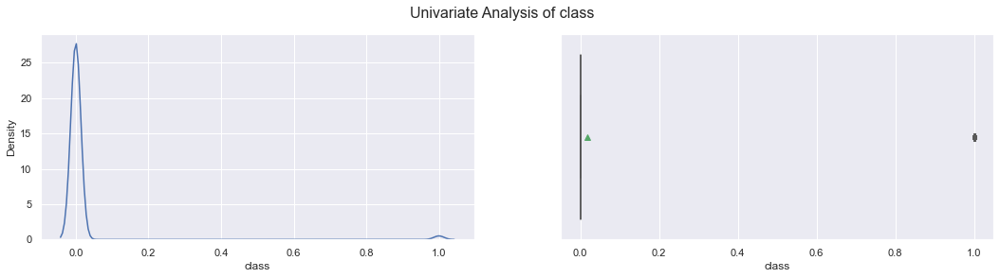

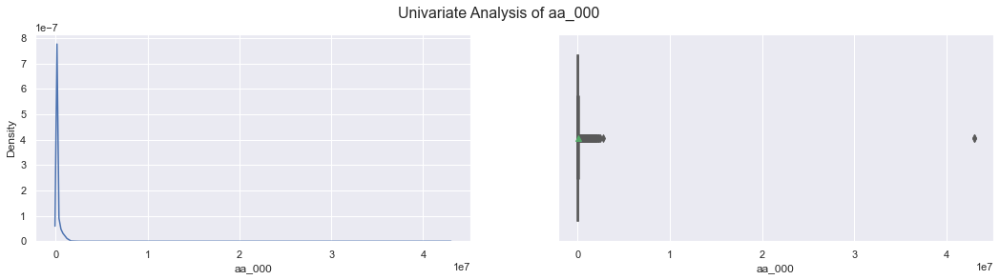

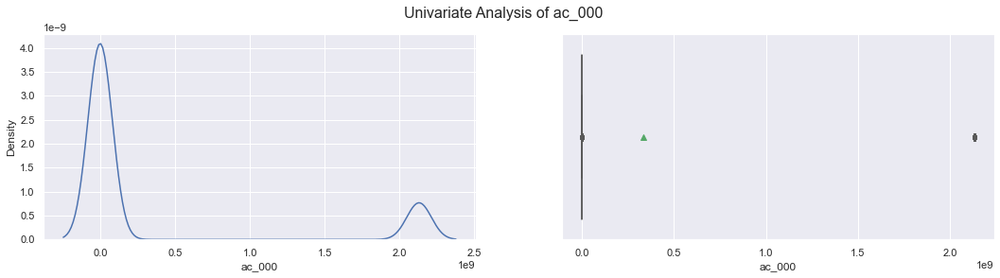

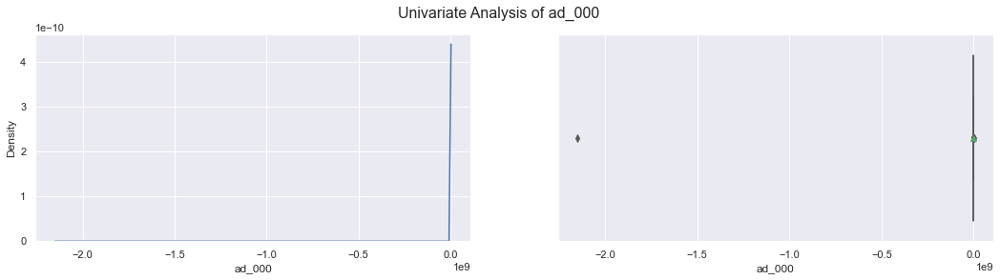

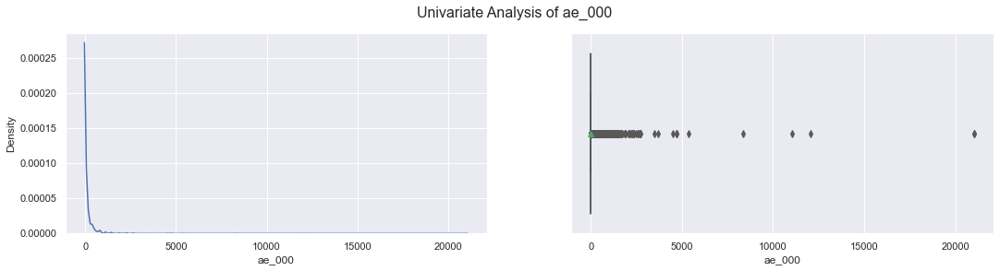

...

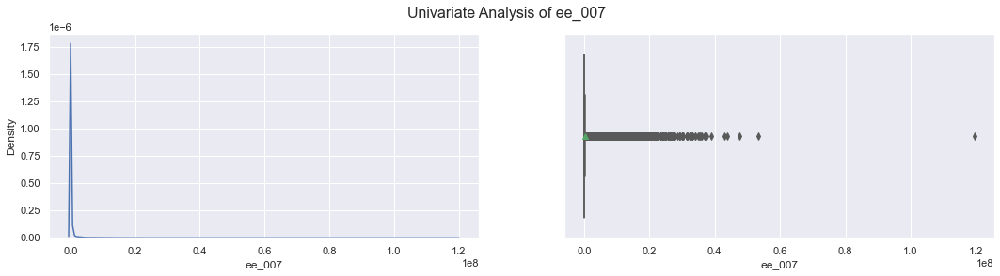

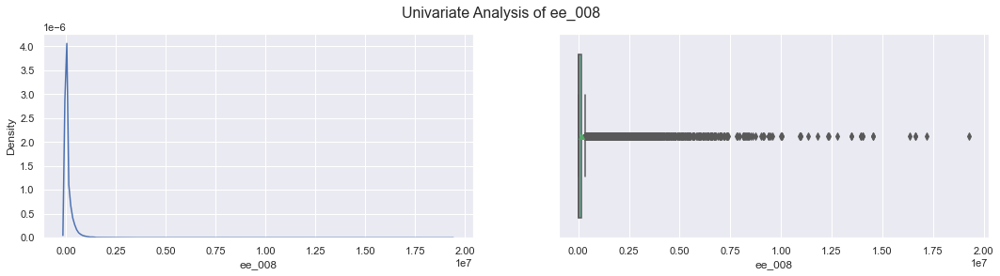

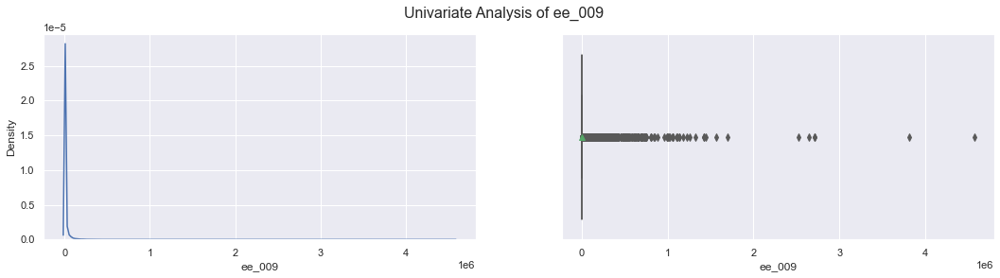

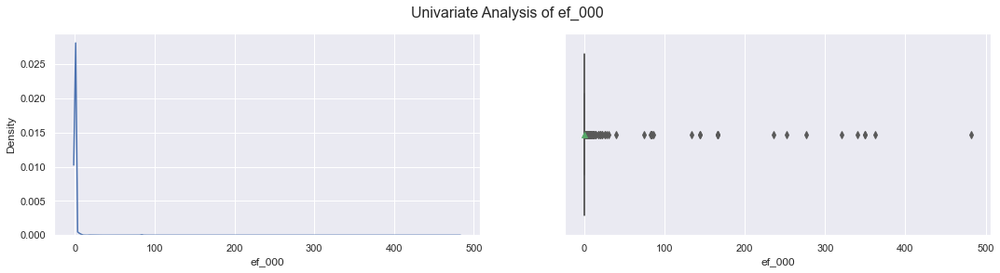

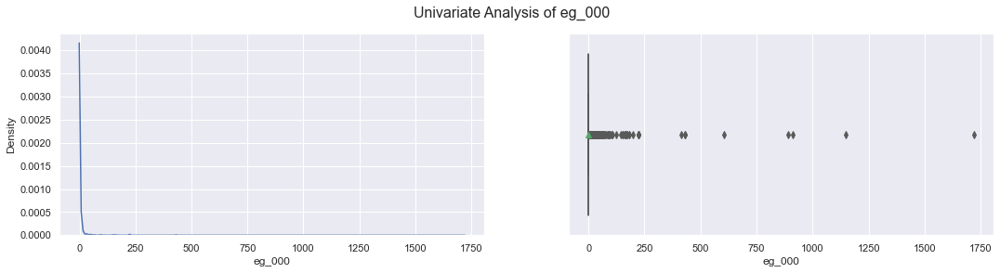

In [40]:
# check the ditribution for the numerical columns
x_axis = numeric_features
for x in x_axis:
    fig, axes = plt.subplots(1, 2, figsize=(18,4))
    sns.distplot(df[x], ax=axes[0], kde = True, hist=False)
    sns.boxplot(df[x], ax=axes[1], orient = "h", showmeans = True,palette="Set2")
    fig.suptitle('Univariate Analysis of ' + x, fontsize=16)

In [46]:
fig = plt.figure(figsize=(20, 850))
for i in range(0, len(numeric_features)):
    ax = plt.subplot(81, 2, i+1)
    sns.regplot(data= df ,y='class', x=numeric_features[i], color='b')
    plt.tight_layout()

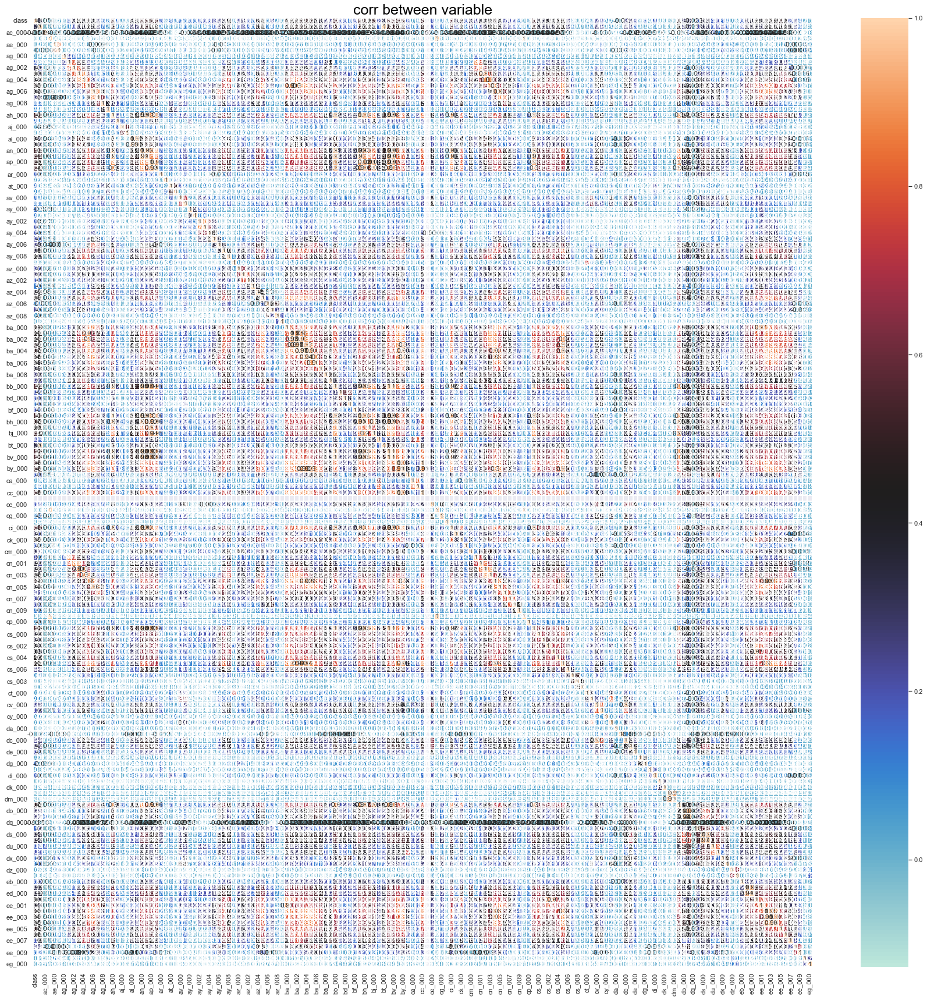

In [51]:
sns.heatmap(df.corr(),annot=True,cmap='icefire',linewidths=0.3)
fig=plt.gcf()
fig.set_size_inches(30,30)
plt.title("corr between variable",color='black',size=25)
plt.show()

## OUTLIERS DETECTION & REMOVAL

### Interquartile Range Method( IQR ) method

In [55]:
## function to remove outliers
def outlier_thresholds(dataframe, variable):
    quartile1 = dataframe[variable].quantile(0.25)
    quartile3 = dataframe[variable].quantile(0.75)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit
    return dataframe

In [56]:
for feature in numeric_features[1:]:
    df = outlier_thresholds(df,feature)

In [57]:
df.shape

(76000, 161)

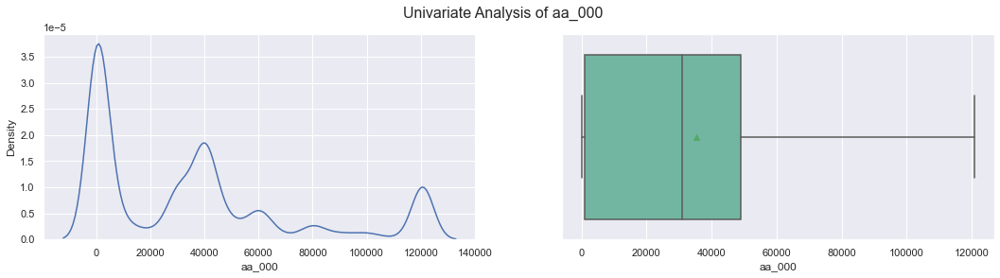

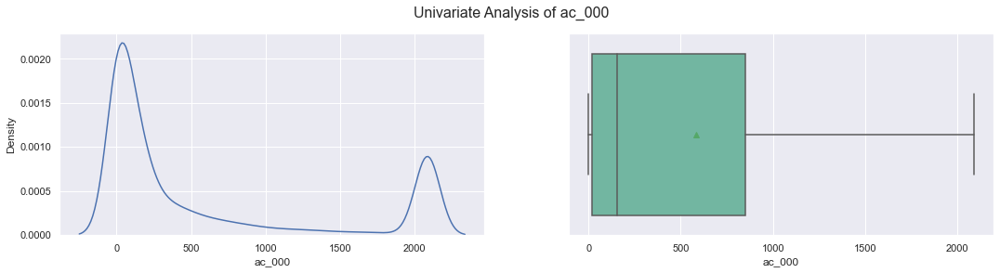

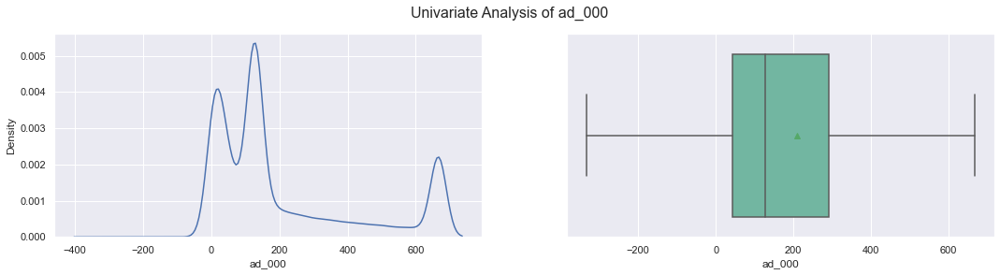

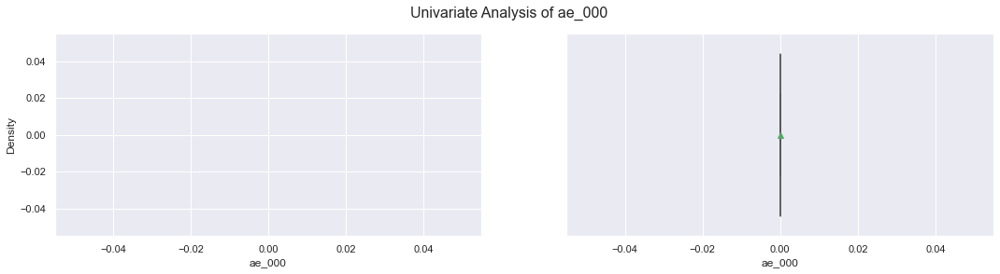

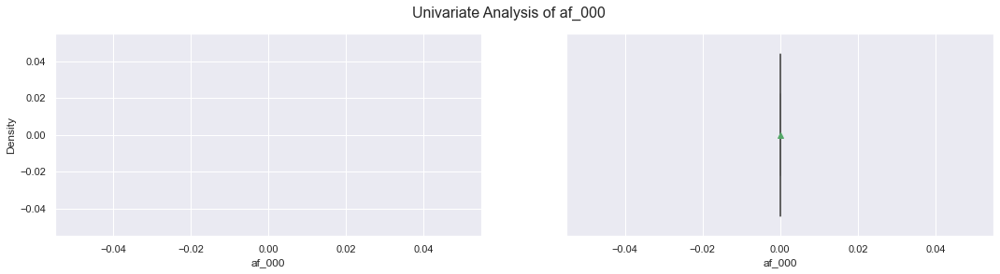

...

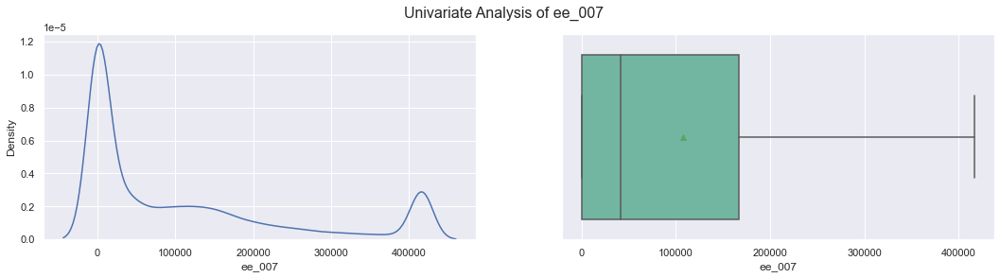

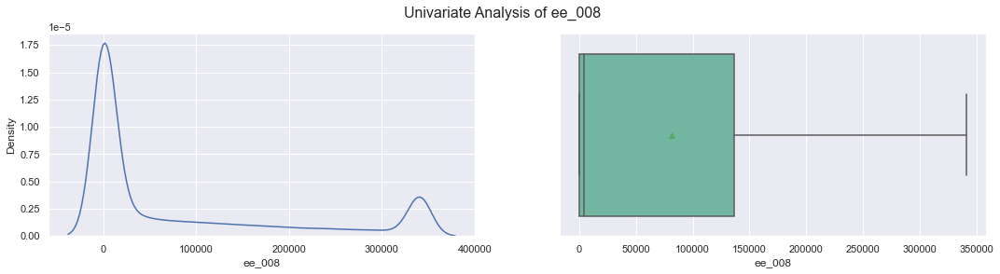

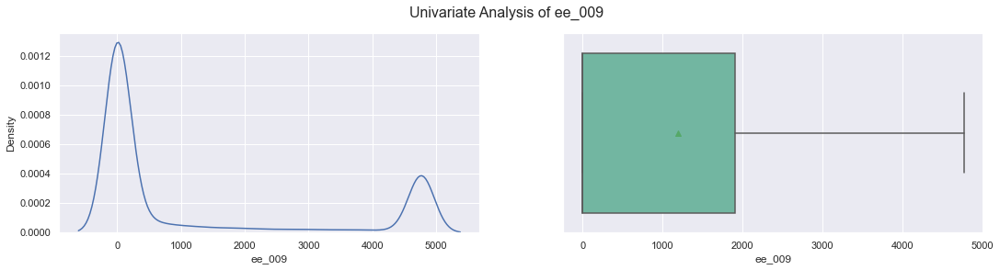

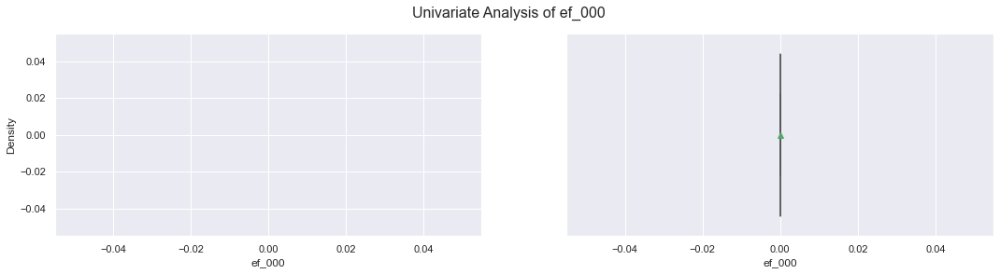

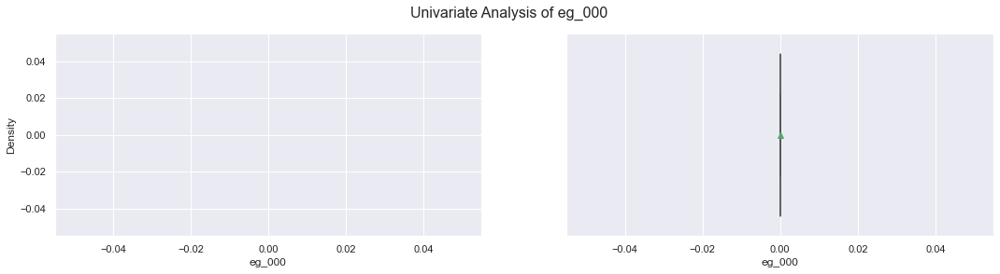

In [58]:
# check the ditribution for the numerical columns
x_axis = numeric_features[1:]
for x in x_axis:
    fig, axes = plt.subplots(1, 2, figsize=(18,4))
    sns.distplot(df[x], ax=axes[0], kde = True, hist=False)
    sns.boxplot(df[x], ax=axes[1], orient = "h", showmeans = True,palette="Set2")
    fig.suptitle('Univariate Analysis of ' + x, fontsize=16)

In [59]:
df

,class,aa_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,2090,280,0,0,0,0,0,0,...,1083002,493384,721044.0,469792,339156.0,157956,73224.00,0,0,0
1,0,33058,0,128,0,0,0,0,0,0,...,421400,178064,293306.0,245416,133654.0,81140,97576.00,1500,0,0
2,0,41040,228,100,0,0,0,0,0,0,...,277378,159812,423992.0,409564,320746.0,158022,95128.00,514,0,0
3,0,12,70,66,0,0,0,0,0,0,...,240,46,58.0,44,10.0,0,0.00,0,0,0
4,0,60874,1368,458,0,0,0,0,0,0,...,622012,229790,405298.0,347188,286954.0,311560,341053.75,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0,81852,2090,667,0,0,0,0,0,0,...,632658,273242,510354.0,373918,349840.0,317840,341053.75,4770,0,0
75996,0,18,52,46,0,0,0,0,0,0,...,266,44,46.0,14,2.0,0,0.00,0,0,0
75997,0,79636,1670,667,0,0,0,0,0,0,...,806832,449962,778826.0,581558,375498.0,222866,341053.75,4770,0,0
75998,0,110,36,32,0,0,0,0,0,0,...,588,210,180.0,544,1004.0,1338,74.00,0,0,0


## Split the data into X & y

In [71]:
# Independent and Dependent Features
X=df.drop(['class'],axis=1)
y=df['class']

In [72]:
X.head()

,aa_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698,2090,280,0,0,0,0,0,0,37250.0,...,1083002,493384,721044.0,469792,339156.0,157956,73224.00,0,0,0
1,33058,0,128,0,0,0,0,0,0,18254.0,...,421400,178064,293306.0,245416,133654.0,81140,97576.00,1500,0,0
2,41040,228,100,0,0,0,0,0,0,1648.0,...,277378,159812,423992.0,409564,320746.0,158022,95128.00,514,0,0
3,12,70,66,0,0,0,0,0,0,2212.0,...,240,46,58.0,44,10.0,0,0.00,0,0,0
4,60874,1368,458,0,0,0,0,0,0,43752.0,...,622012,229790,405298.0,347188,286954.0,311560,341053.75,1218,0,0


In [73]:
y

0        0
1        0
2        0
3        0
4        0
        ..
75995    0
75996    0
75997    0
75998    0
75999    0
Name: class, Length: 76000, dtype: int32

## Train Test Split

In [74]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size = 0.33, random_state = 42)

In [75]:
X_train.shape , y_train.shape

((50920, 160), (50920,))

In [76]:
X_test.shape, y_test.shape

((25080, 160), (25080,))

## Standardize or feature scaling the dataset

In [77]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [78]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Model Building

### Model 1 : Using Logistic Regression

In [79]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression

In [80]:
log_reg = LogisticRegression()
log_reg.fit(X_train,y_train)
y_pred1 = log_reg.predict(X_test)

In [81]:
log_reg.score(X_train,y_train)

0.9895718774548311

In [82]:
acc_log = accuracy_score(y_test,y_pred1)
acc_log

0.9869617224880383

In [83]:
# Confusion Matrix
conf_mat_log = confusion_matrix(y_test,y_pred1)
conf_mat_log

array([[24529,    82],
       [  245,   224]], dtype=int64)

In [84]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred1))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.73      0.48      0.58       469

    accuracy                           0.99     25080
   macro avg       0.86      0.74      0.79     25080
weighted avg       0.99      0.99      0.99     25080



In [85]:
# Area Under Curve
auc_log = roc_auc_score(y_test, y_pred1)
auc_log

0.7371400484069434

## ROC

In [86]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred1)

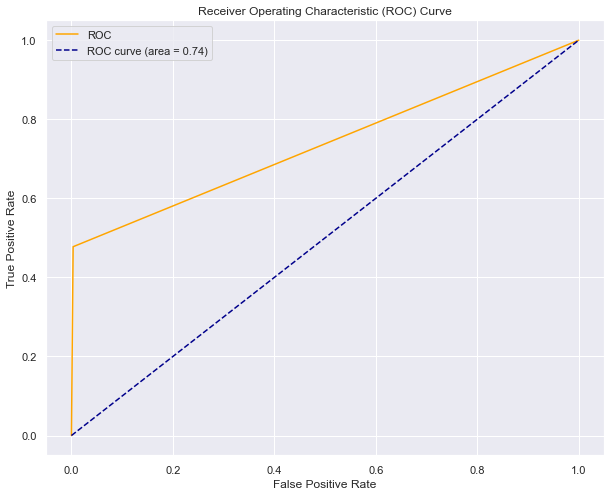

In [90]:
fig = plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc_log)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

### Model 2 : Using Support Vector Classifier

In [91]:
from sklearn.svm import SVC

In [92]:
svc=SVC()
svc.fit(X_train,y_train)
y_pred2= svc.predict(X_test)

In [95]:
svc.score(X_train,y_train)

0.992949725058916

In [96]:
acc_svc = accuracy_score(y_test,y_pred2)
acc_svc

0.9892344497607656

In [97]:
# Confusion Matrix
conf_mat_svc = confusion_matrix(y_test,y_pred2)
conf_mat_svc

array([[24570,    41],
       [  229,   240]], dtype=int64)

In [98]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred2))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.85      0.51      0.64       469

    accuracy                           0.99     25080
   macro avg       0.92      0.76      0.82     25080
weighted avg       0.99      0.99      0.99     25080



In [99]:
# Area Under Curve
auc_svc = roc_auc_score(y_test, y_pred2)
auc_svc

0.7550305785744739

### Hyperparameters Tuning

In [101]:
from sklearn.model_selection import RandomizedSearchCV

In [102]:
random_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf','polynomial','sigmoid']}

In [103]:
random_grid_svc=RandomizedSearchCV(estimator=svc,param_distributions=random_grid,n_iter = 10,cv=5,verbose=2,random_state = 42,n_jobs=-1)

In [104]:
random_grid_svc.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['rbf', 'polynomial',
                                                   'sigmoid']},
                   random_state=42, verbose=2)

In [105]:
random_grid_svc.best_params_

{'kernel': 'rbf', 'gamma': 0.001, 'C': 1000}

In [107]:
svc_grid = SVC(C=1000, gamma=0.001, kernel='rbf')

In [108]:
svc_grid.fit(X_train,y_train)

SVC(C=1000, gamma=0.001)

In [110]:
y_pred_svctuned = svc_grid.predict(X_test)

In [111]:
svc_grid.score(X_train,y_train)

0.9978593872741556

In [112]:
acc_svc_tuned = accuracy_score(y_test,y_pred_svctuned)
acc_svc_tuned

0.9894338118022329

In [113]:
# Area Under Curve
auc_svc_tuned = roc_auc_score(y_test, y_pred_svctuned)
auc_svc_tuned

0.8283368965235526

In [114]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_svctuned))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.75      0.66      0.70       469

    accuracy                           0.99     25080
   macro avg       0.87      0.83      0.85     25080
weighted avg       0.99      0.99      0.99     25080



In [115]:
# Confusion Matrix
conf_mat_svc_tuned = confusion_matrix(y_test,y_pred_svctuned)
conf_mat_svc_tuned

array([[24505,   106],
       [  159,   310]], dtype=int64)

## Model 3: Decision Tree Classifier

In [116]:
from sklearn.tree import DecisionTreeClassifier
dt_model=DecisionTreeClassifier()

In [117]:
dt_model.fit(X_train,y_train)
y_pred3 = dt_model.predict(X_test)

In [118]:
dt_model.score(X_train,y_train)

1.0

In [119]:
acc_dt = accuracy_score(y_test,y_pred3)
acc_dt

0.9836921850079745

[Text(666.1125, 757.1571428571428, 'X[85] <= 2.269\ngini = 0.035\nsamples = 50920\nvalue = [50014, 906]'),
 Text(336.54375, 640.6714285714286, 'X[79] <= 2.347\ngini = 0.002\nsamples = 46427\nvalue = [46374, 53]'),
 Text(188.325, 524.1857142857143, 'X[69] <= 1.766\ngini = 0.001\nsamples = 46003\nvalue = [45976, 27]'),
 Text(111.6, 407.7, 'X[62] <= 1.994\ngini = 0.001\nsamples = 44457\nvalue = [44443, 14]'),
 Text(55.8, 291.21428571428567, 'X[0] <= 2.228\ngini = 0.0\nsamples = 39255\nvalue = [39249, 6]'),
 Text(27.9, 174.7285714285714, 'X[109] <= -0.843\ngini = 0.0\nsamples = 39071\nvalue = [39066, 5]'),
 Text(13.95, 58.24285714285713, '\n  (...)  \n'),
 Text(41.849999999999994, 58.24285714285713, '\n  (...)  \n'),
 Text(83.69999999999999, 174.7285714285714, 'X[71] <= 1.057\ngini = 0.011\nsamples = 184\nvalue = [183, 1]'),
 Text(69.75, 58.24285714285713, '\n  (...)  \n'),
 Text(97.64999999999999, 58.24285714285713, '\n  (...)  \n'),
 Text(167.39999999999998, 291.21428571428567, 'X[109] <

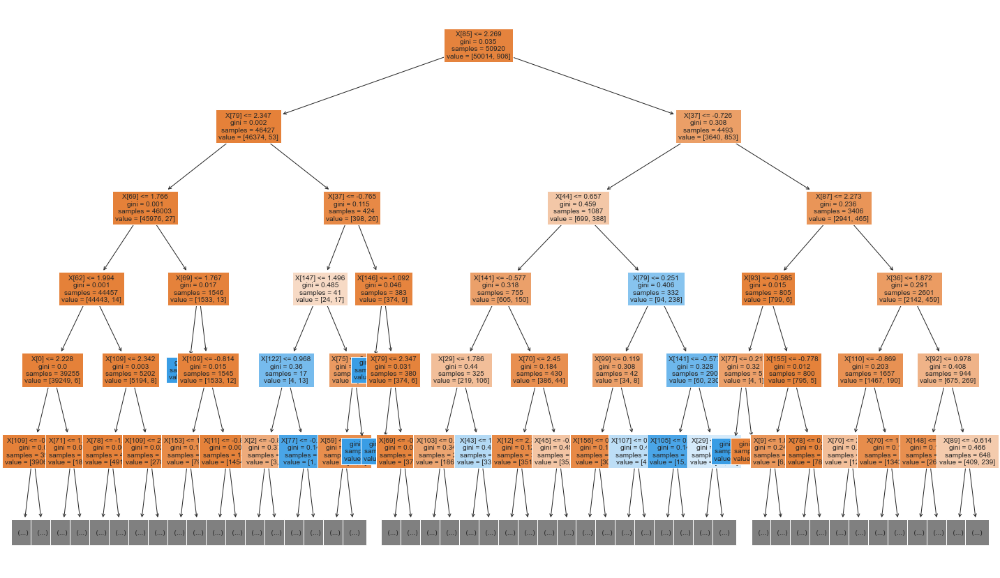

In [122]:
from sklearn import tree
plt.figure(figsize=(25,15))
tree.plot_tree(dt_model,max_depth=5,filled=True,fontsize=10)

In [123]:
# Confusion Matrix
conf_mat_dt = confusion_matrix(y_test,y_pred3)
conf_mat_dt

array([[24396,   215],
       [  194,   275]], dtype=int64)

In [124]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred3))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     24611
           1       0.56      0.59      0.57       469

    accuracy                           0.98     25080
   macro avg       0.78      0.79      0.78     25080
weighted avg       0.98      0.98      0.98     25080



In [125]:
# Area Under Curve
auc_dt = roc_auc_score(y_test, y_pred3)
auc_dt

0.7888090067375874

### Hyperparameters Tuning

In [126]:
# Hyperparameter Tuning
random_grid = {"criterion":['gini','entropy'],
              "splitter":['best','random'],
              "max_depth":range(2,40,1),
              "min_samples_split":range(2,10,1),
              "min_samples_leaf":range(1,10,1),
              "ccp_alpha":np.random.rand(20)
              }

In [128]:
random_grid_dt=RandomizedSearchCV(estimator=dt_model,param_distributions=random_grid,n_iter = 10,cv=5,verbose=2,random_state = 42,n_jobs=-1)

In [129]:
random_grid_dt.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
                   param_distributions={'ccp_alpha': array([0.89273067, 0.53086725, 0.5694838 , 0.84568264, 0.58927801,
       0.53095351, 0.34742006, 0.84690012, 0.31014606, 0.47128282,
       0.36080695, 0.01958231, 0.85927958, 0.48611985, 0.31490921,
       0.50829193, 0.0090616 , 0.85184182, 0.65396486, 0.26705855]),
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': range(2, 40),
                                        'min_samples_leaf': range(1, 10),
                                        'min_samples_split': range(2, 10),
                                        'splitter': ['best', 'random']},
                   random_state=42, verbose=2)

In [130]:
random_grid_dt.best_params_

{'splitter': 'best',
 'min_samples_split': 5,
 'min_samples_leaf': 9,
 'max_depth': 12,
 'criterion': 'gini',
 'ccp_alpha': 0.01958231296959756}

In [131]:
dt_grid=DecisionTreeClassifier(criterion='gini',max_depth=12,min_samples_leaf=9,min_samples_split=5,splitter='best',ccp_alpha=0.0195)

In [132]:
dt_grid.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0195, max_depth=12, min_samples_leaf=9,
                       min_samples_split=5)

In [133]:
dt_grid.score(X_train,y_train)

0.9822073841319717

In [134]:
y_pred_dttuned = dt_grid.predict(X_test)

In [135]:
acc_dt_tuned = accuracy_score(y_test,y_pred_dttuned)
acc_dt_tuned

0.9812998405103668

In [136]:
# Area Under Curve
auc_dt_tuned = roc_auc_score(y_test, y_pred_dttuned)
auc_dt_tuned

0.5

In [137]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_dttuned))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     24611
           1       0.00      0.00      0.00       469

    accuracy                           0.98     25080
   macro avg       0.49      0.50      0.50     25080
weighted avg       0.96      0.98      0.97     25080



In [138]:
# Confusion Matrix
conf_mat_dt_tuned = confusion_matrix(y_test,y_pred_dttuned)
conf_mat_dt_tuned

array([[24611,     0],
       [  469,     0]], dtype=int64)

## Model 4: Random Forest Classifier

In [143]:
from sklearn.ensemble import RandomForestClassifier
Rf_model=RandomForestClassifier()

In [144]:
Rf_model.fit(X_train,y_train)
y_pred4 = Rf_model.predict(X_test)

In [145]:
Rf_model.score(X_train,y_train)

1.0

In [146]:
acc_rf = accuracy_score(y_test,y_pred4)
acc_rf

0.9900717703349282

In [147]:
# Confusion Matrix
conf_mat_rf = confusion_matrix(y_test,y_pred4)
conf_mat_rf

array([[24584,    27],
       [  222,   247]], dtype=int64)

In [148]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred4))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.90      0.53      0.66       469

    accuracy                           0.99     25080
   macro avg       0.95      0.76      0.83     25080
weighted avg       0.99      0.99      0.99     25080



In [149]:
# Area Under Curve
auc_rf = roc_auc_score(y_test, y_pred4)
auc_rf

0.7627776908049593

### Hyperparameters Tuning

In [150]:
# Hyperparameter Tuning
random_grid = {'n_estimators' : [5,10,50,100,120,150],
              'criterion': ['gini', 'entropy'],
              'max_depth' : range(2,20,1),
              'min_samples_leaf' : range(1,10,1),
              'min_samples_split': range(2,10,1),
              'max_features' : ['auto', 'sqrt'],
              'ccp_alpha':np.random.rand(20)
              }

In [151]:
rf_grid=RandomizedSearchCV(estimator=Rf_model,param_distributions=random_grid,n_iter = 10,cv=5,verbose=2,random_state = 42,n_jobs=-1)

In [152]:
rf_grid.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'ccp_alpha': array([0.52336732, 0.67586995, 0.95243104, 0.93822572, 0.13286004,
       0.55382816, 0.96853695, 0.88646727, 0.62191121, 0.46731248,
       0.78041918, 0.40700712, 0.68767054, 0.71861489, 0.30993371,
       0.86778255, 0.98649496, 0.86890346, 0.42793624, 0.07001897]),
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': range(2, 20),
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': range(1, 10),
                                        'min_samples_split': range(2, 10),
                                        'n_estimators': [5, 10, 50, 100, 120,
                                                         150]},
                   random_state=42, verbose=2)

In [153]:
rf_grid.best_params_

{'n_estimators': 50,
 'min_samples_split': 8,
 'min_samples_leaf': 3,
 'max_features': 'auto',
 'max_depth': 17,
 'criterion': 'entropy',
 'ccp_alpha': 0.9382257152179939}

In [154]:
Rf_model_grid=RandomForestClassifier(n_estimators=50,min_samples_split=8,min_samples_leaf=3,max_features='auto',max_depth=17,criterion='entropy',ccp_alpha=0.9382)

In [155]:
Rf_model_grid.fit(X_train,y_train)

RandomForestClassifier(ccp_alpha=0.9382, criterion='entropy', max_depth=17,
                       min_samples_leaf=3, min_samples_split=8,
                       n_estimators=50)

In [156]:
y_pred_rftuned=Rf_model_grid.predict(X_test)

In [157]:
Rf_model_grid.score(X_train,y_train)

0.9822073841319717

In [158]:
acc_rf_tuned = accuracy_score(y_test,y_pred_rftuned)
acc_rf_tuned

0.9812998405103668

In [159]:
# Area Under Curve
auc_rf_tuned = roc_auc_score(y_test, y_pred_rftuned)
auc_rf_tuned

0.5

In [160]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_rftuned))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     24611
           1       0.00      0.00      0.00       469

    accuracy                           0.98     25080
   macro avg       0.49      0.50      0.50     25080
weighted avg       0.96      0.98      0.97     25080



In [161]:
# Confusion Matrix
conf_mat_rf_tuned = confusion_matrix(y_test,y_pred_rftuned)
conf_mat_rf_tuned

array([[24611,     0],
       [  469,     0]], dtype=int64)

## Model 5: AdaBoost Classifier

In [166]:
from sklearn.ensemble import AdaBoostClassifier

In [167]:
ada_model = AdaBoostClassifier()
ada_model.fit(X_train,y_train)
y_pred5=ada_model.predict(X_test)

In [168]:
ada_model.score(X_train,y_train)

0.9885506677140613

In [169]:
acc_ada = accuracy_score(y_test,y_pred5)
acc_ada

0.9863237639553429

In [170]:
# Confusion Matrix
conf_mat_ada = confusion_matrix(y_test,y_pred5)
conf_mat_ada

array([[24523,    88],
       [  255,   214]], dtype=int64)

In [171]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred5))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.71      0.46      0.56       469

    accuracy                           0.99     25080
   macro avg       0.85      0.73      0.77     25080
weighted avg       0.98      0.99      0.98     25080



In [172]:
# Area Under Curve
auc_ada = roc_auc_score(y_test, y_pred5)
auc_ada

0.7263571708838568

### Hyperparameters Tuning

In [173]:
# Hyperparameter Tuning
random_grid = {"n_estimators" : [90,100,130,150],
              "learning_rate" : [0.001,0.01,0.1,0.5]
              }

In [174]:
random_grid_ada=RandomizedSearchCV(estimator=ada_model,param_distributions=random_grid,n_iter = 10,cv=5,verbose=2,random_state = 42,n_jobs=-1)

In [175]:
random_grid_ada.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.001, 0.01, 0.1,
                                                          0.5],
                                        'n_estimators': [90, 100, 130, 150]},
                   random_state=42, verbose=2)

In [176]:
random_grid_ada.best_params_

{'n_estimators': 150, 'learning_rate': 0.5}

In [177]:
ada_grid = AdaBoostClassifier(learning_rate=0.5,n_estimators=150)

In [178]:
ada_grid.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=0.5, n_estimators=150)

In [179]:
y_pred_adatuned=ada_grid.predict(X_test)

In [180]:
ada_grid.score(X_train,y_train)

0.9894344069128044

In [181]:
acc_ada_tuned = accuracy_score(y_test,y_pred_adatuned)
acc_ada_tuned

0.986682615629984

In [182]:
# Area Under Curve
auc_ada_tuned = roc_auc_score(y_test, y_pred_adatuned)
auc_ada_tuned

0.7181737602554165

In [183]:
# Confusion Matrix
conf_mat_ada_tuned = confusion_matrix(y_test,y_pred_adatuned)
conf_mat_ada_tuned

array([[24540,    71],
       [  263,   206]], dtype=int64)

In [184]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_adatuned))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.74      0.44      0.55       469

    accuracy                           0.99     25080
   macro avg       0.87      0.72      0.77     25080
weighted avg       0.98      0.99      0.98     25080



## Model 6: Gradient Boosting Classifier

In [185]:
from sklearn.ensemble import GradientBoostingClassifier
model_gbm=GradientBoostingClassifier()

In [186]:
model_gbm.fit(X_train,y_train)
y_pred6 = model_gbm.predict(X_test)

In [187]:
model_gbm.score(X_train,y_train)

0.9917517674783974

In [188]:
acc_gbm = accuracy_score(y_test,y_pred6)
acc_gbm

0.9880382775119617

In [189]:
# Confusion Matrix
conf_mat_gbm = confusion_matrix(y_test,y_pred6)
conf_mat_gbm

array([[24561,    50],
       [  250,   219]], dtype=int64)

In [190]:
print(classification_report(y_test,y_pred6))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.81      0.47      0.59       469

    accuracy                           0.99     25080
   macro avg       0.90      0.73      0.79     25080
weighted avg       0.99      0.99      0.99     25080



In [191]:
# Area Under Curve
auc_gbm = roc_auc_score(y_test, y_pred6)
auc_gbm

0.7324596738037034

### Hyperparameters Tuning

In [192]:
# Hyperparameter Tuning
random_grid = {
    "learning_rate" : [0.01,0.001,0.1,0.0001],
    "n_estimators" : [90,100,115,130],
    'criterion': ['friedman_mse','squared_error','mse'],
    'max_depth' : range(2,20,1),
    'min_samples_leaf' : range(1,10,1),
    'min_samples_split': range(2,10,1),
    'max_features' : ['auto','log2']
}

In [193]:
random_grid_gbm=RandomizedSearchCV(estimator=model_gbm,param_distributions=random_grid,n_iter = 10,cv=5,verbose=2,random_state = 42,n_jobs=-1)

In [194]:
random_grid_gbm.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['friedman_mse',
                                                      'squared_error', 'mse'],
                                        'learning_rate': [0.01, 0.001, 0.1,
                                                          0.0001],
                                        'max_depth': range(2, 20),
                                        'max_features': ['auto', 'log2'],
                                        'min_samples_leaf': range(1, 10),
                                        'min_samples_split': range(2, 10),
                                        'n_estimators': [90, 100, 115, 130]},
                   random_state=42, verbose=2)

In [195]:
random_grid_gbm.best_params_

{'n_estimators': 90,
 'min_samples_split': 9,
 'min_samples_leaf': 8,
 'max_features': 'auto',
 'max_depth': 13,
 'learning_rate': 0.1,
 'criterion': 'mse'}

In [196]:
gbm_grid=GradientBoostingClassifier(n_estimators=90,min_samples_split=9,min_samples_leaf=8,max_features='auto',max_depth=13,learning_rate=0.1,criterion='mse')

In [197]:
gbm_grid.fit(X_train,y_train)

GradientBoostingClassifier(criterion='mse', max_depth=13, max_features='auto',
                           min_samples_leaf=8, min_samples_split=9,
                           n_estimators=90)

In [198]:
y_pred_gbmtuned=gbm_grid.predict(X_test)

In [199]:
gbm_grid.score(X_train,y_train)

1.0

In [200]:
acc_gbm_tuned = accuracy_score(y_test,y_pred_gbmtuned)
acc_gbm_tuned

0.9901116427432217

In [201]:
# Confusion Matrix
conf_mat_gbm_tuned = confusion_matrix(y_test,y_pred_gbmtuned)
conf_mat_gbm_tuned

array([[24551,    60],
       [  188,   281]], dtype=int64)

In [202]:
print(classification_report(y_test,y_pred_gbmtuned))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24611
           1       0.82      0.60      0.69       469

    accuracy                           0.99     25080
   macro avg       0.91      0.80      0.84     25080
weighted avg       0.99      0.99      0.99     25080



In [203]:
# Area Under Curve
auc_gbm_tuned = roc_auc_score(y_test, y_pred_gbmtuned)
auc_gbm_tuned

0.7983545936390709

## Model 7: XGBoost Classifier

In [204]:
from xgboost import XGBClassifier
model_xgb=XGBClassifier()

In [205]:
model_xgb.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [206]:
y_pred7=model_xgb.predict(X_test)

In [207]:
model_xgb.score(X_train,y_train)

0.999980361351139

In [208]:
acc_xgb = accuracy_score(y_test,y_pred7)
acc_xgb

0.991347687400319

In [210]:
# Confusion Matrix
conf_mat_xgb = confusion_matrix(y_test,y_pred7)
conf_mat_xgb

array([[24562,    49],
       [  168,   301]], dtype=int64)

In [211]:
print(classification_report(y_test,y_pred7))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     24611
           1       0.86      0.64      0.74       469

    accuracy                           0.99     25080
   macro avg       0.93      0.82      0.87     25080
weighted avg       0.99      0.99      0.99     25080



In [212]:
# Area Under Curve
auc_xgb = roc_auc_score(y_test, y_pred7)
auc_xgb

0.8199000325664352

### Hyperparameters Tuning

In [213]:
# Hyperparameter Tuning
random_grid = {
    "learning_rate" : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
    "booster" : ['dart','gbtree','gblinear'],
    "n_estimators" : [100, 250, 500, 750],
    "max_depth" : range(2,20,1),
    "min_child_weight" : [ 1, 3, 5, 7 ],
    "gamma" : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
    "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
}

In [214]:
random_grid_xgb=RandomizedSearchCV(estimator=model_xgb,param_distributions=random_grid,n_iter = 10,cv=5,verbose=2,random_state = 42,n_jobs=-1)

In [217]:
random_grid_xgb.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           callbacks=None, colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=0, gpu_id=-1,
                                           grow_policy='depthwise',
                                           importance_type=None,
                                           interaction_constraints='',
                                           learning_rate=0.300...
                                           num_parallel_tree=1,
                                           predictor='auto', random_state=

In [218]:
random_grid_xgb.best_params_

{'n_estimators': 500,
 'min_child_weight': 3,
 'max_depth': 12,
 'learning_rate': 0.25,
 'gamma': 0.1,
 'colsample_bytree': 0.5,
 'booster': 'gbtree'}

In [219]:
xgb_grid=XGBClassifier(n_estimators=500,min_child_weight=3,max_depth=12,learning_rate=0.25,gamma=0.1,colsample_bytree=0.5,booster='gbtree')

In [220]:
xgb_grid.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.5,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.1, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.25, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=12, max_leaves=0, min_child_weight=3, missing=nan,
              monotone_constraints='()', n_estimators=500, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [221]:
y_pred_xgbtuned=xgb_grid.predict(X_test)

In [222]:
xgb_grid.score(X_train,y_train)

0.999980361351139

In [223]:
acc_xgb_tuned = accuracy_score(y_test,y_pred_xgbtuned)
acc_xgb_tuned

0.9910287081339713

In [224]:
# Confusion Matrix
conf_mat_xgb_tuned = confusion_matrix(y_test,y_pred_xgbtuned)
conf_mat_xgb_tuned

array([[24556,    55],
       [  170,   299]], dtype=int64)

In [225]:
print(classification_report(y_test,y_pred_xgbtuned))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     24611
           1       0.84      0.64      0.73       469

    accuracy                           0.99     25080
   macro avg       0.92      0.82      0.86     25080
weighted avg       0.99      0.99      0.99     25080



In [226]:
# Area Under Curve
auc_xgb_tuned = roc_auc_score(y_test, y_pred_xgbtuned)
auc_xgb_tuned

0.8176459396915363

## Feature Importance

In [227]:
xgb_grid.feature_importances_

array([0.01130422, 0.00192405, 0.00357512, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.00323568,
       0.00169357, 0.00553566, 0.00462855, 0.00273043, 0.00164712,
       0.00315138, 0.        , 0.        , 0.        , 0.00452744,
       0.00363724, 0.00327746, 0.01062448, 0.03404251, 0.02105168,
       0.        , 0.        , 0.        , 0.        , 0.00260925,
       0.00510373, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00628405, 0.00630601, 0.00387278, 0.00386208,
       0.        , 0.00500309, 0.00341826, 0.01514605, 0.0083448 ,
       0.00253844, 0.01649098, 0.00370595, 0.        , 0.        ,
       0.        , 0.00172002, 0.0045838 , 0.00139657, 0.00692563,
       0.00561122, 0.00405884, 0.00436999, 0.00342572, 0.00231957,
       0.00365611, 0.00275065, 0.00473099, 0.00208754, 0.00291323,
       0.00209732, 0.00107628, 0.00062832, 0.01043742, 0.01579172,
       0.00406045, 0.01628235, 0.01690461, 0.00200848, 0.00598

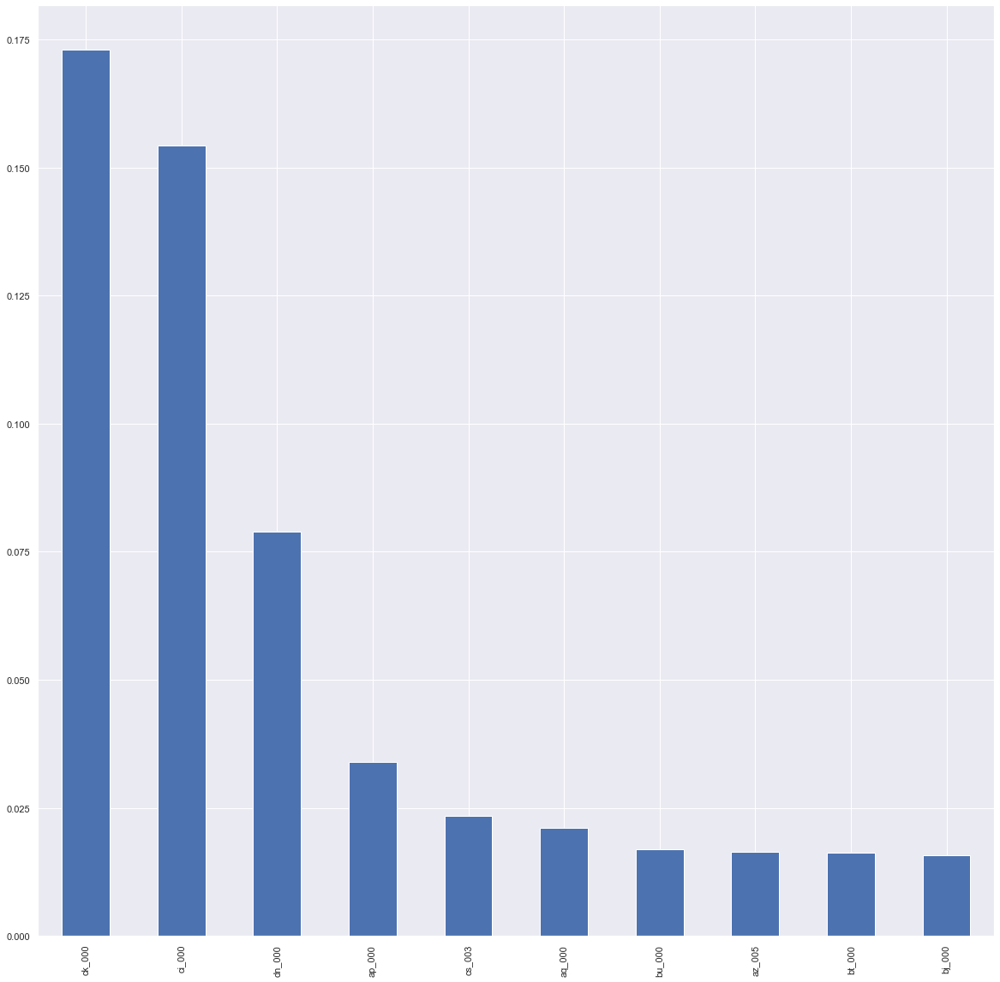

In [229]:
feat_importances = pd.Series(xgb_grid.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='bar')
plt.show()

## Comparing predicted values for all models

In [240]:
df_compare=pd.DataFrame({'Actual':y_test,'Logistic':y_pred1,'SVC':y_pred2,'SVC_tuned':y_pred_svctuned,'DT':y_pred3,'DT_tuned':y_pred_dttuned,'RF':y_pred4,'RF_tuned':y_pred_rftuned,'AdaBoost':y_pred5,'Ada_tuned':y_pred_adatuned,'GBM':y_pred6,'GBM_tuned':y_pred_gbmtuned,'XGB':y_pred7,'XGB_tuned':y_pred_xgbtuned})
df_compare.sample(10)

,Actual,Logistic,SVC,SVC_tuned,DT,DT_tuned,RF,RF_tuned,AdaBoost,Ada_tuned,GBM,GBM_tuned,XGB,XGB_tuned
33526,0,0,0,0,0,0,0,0,0,0,0,0,0,0
67930,0,0,0,0,0,0,0,0,0,0,0,0,0,0
74444,0,0,0,0,0,0,0,0,0,0,0,0,0,0
28480,0,0,0,0,0,0,0,0,0,0,0,0,0,0
27743,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24851,0,0,0,0,0,0,0,0,0,0,0,0,0,0
68620,0,0,0,0,0,0,0,0,0,0,0,0,0,0
30727,1,1,1,1,1,0,1,0,1,1,1,1,1,1
61036,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6415,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [256]:
# Compare accuracy scores for all models
results=({'Logistic':acc_log,'SVC':acc_svc,'SVC_tuned':acc_svc_tuned,'DT':acc_dt,'DT_tuned':acc_dt_tuned,'RF':acc_rf,'RF_tuned':acc_rf_tuned,'AdaBoost':acc_ada,'Ada_tuned':acc_ada_tuned,'GBM':acc_gbm,'GBM_tuned':acc_gbm_tuned,'XGB':acc_xgb,'XGB_tuned':acc_xgb_tuned})

In [257]:
results=pd.DataFrame(results,index=['Accuracy'])
results.T

,Accuracy
Logistic,0.986962
SVC,0.989234
SVC_tuned,0.989434
DT,0.983692
DT_tuned,0.981300
RF,0.990072
RF_tuned,0.981300
AdaBoost,0.986324
Ada_tuned,0.986683
GBM,0.988038


In [259]:
# Compare auc score for all models
auc_score=({'Logistic':auc_log,'SVC':auc_svc,'SVC_tuned':auc_svc_tuned,'DT':auc_dt,'DT_tuned':auc_dt_tuned,'RF':auc_rf,'RF_tuned':auc_rf_tuned,'AdaBoost':auc_ada,'Ada_tuned':auc_ada_tuned,'GBM':auc_gbm,'GBM_tuned':auc_gbm_tuned,'XGB':auc_xgb,'XGB_tuned':auc_xgb_tuned})

In [260]:
auc_score=pd.DataFrame(auc_score,index=['AUC'])
auc_score.T

,AUC
Logistic,0.737140
SVC,0.755031
SVC_tuned,0.828337
DT,0.788809
DT_tuned,0.500000
RF,0.762778
RF_tuned,0.500000
AdaBoost,0.726357
Ada_tuned,0.718174
GBM,0.732460
